# COVID-19 Forecasting and Analysis

## Introduction

As of August 2020, COVID-19 pandemic has claimed over 760,000 lives across the world and over 13 million people have been infected. Understanding the factors and policies that influence the spread of the virus can help governments make informed decisions in order to control infections and deaths until a vaccine is being developed.

The goal of this article is to answer the following questions:

- **What are the factors and policies that have the greatest impact on the number of cases and deaths across the world?**
- **How can we predict the number of COVID-19 cases and deaths in the future?**

## Import Libraries

In [1]:
!pip install plotly yellowbrick joblib seaborn orca keras xgboost pycountry geopy

In [2]:
import numpy as np
import math
import pandas as pd
from collections import defaultdict
from functools import reduce
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
from matplotlib.cm import get_cmap
import plotly.offline as pyo
pyo.init_notebook_mode()
import pycountry
from pycountry import countries
from geopy.geocoders import Nominatim
from datetime import datetime
from yellowbrick.regressor import ResidualsPlot
from joblib import load, dump
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

/Users/amol/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.



## Read Data

In [3]:
covid_19_data = pd.read_csv('./data/covid_19_data.csv')
confirmed_cases = pd.read_csv('./data/time_series_covid_19_confirmed.csv')
deaths = pd.read_csv('./data/time_series_covid_19_deaths.csv')
recovered = pd.read_csv('./data/time_series_covid_19_recovered.csv')
confirmed_cases_us = pd.read_csv('./data/time_series_covid_19_confirmed_US.csv')
owid_covid_data = pd.read_csv('./data/owid-covid-data.csv')


policy_data = defaultdict()

policy_data['public_events_policies'] = pd.read_csv('./data/public-events-covid.csv')
policy_data['public_gathering_policies'] = pd.read_csv('./data/public-gathering-rules-covid.csv')
policy_data['public_information_campaigns'] = pd.read_csv('./data/public-campaigns-covid.csv')
policy_data['public_transport_policies'] = pd.read_csv('./data/public-transport-covid.csv')
policy_data['school_closures'] = pd.read_csv('./data/school-closures-covid.csv')
policy_data['work_closures'] = pd.read_csv('./data/workplace-closures-covid.csv')
policy_data['stay_at_home_policies'] = pd.read_csv('./data/stay-at-home-covid.csv')
policy_data['contract_tracing'] = pd.read_csv('./data/covid-contact-tracing.csv')
policy_data['debt_relief'] = pd.read_csv('./data/debt-relief-covid.csv')
policy_data['income_support'] = pd.read_csv('./data/income-support-covid.csv')
policy_data['internal_movement'] = pd.read_csv('./data/internal-movement-covid.csv')
policy_data['international_travel'] = pd.read_csv('./data/international-travel-covid.csv')
policy_data['testing_policy'] = pd.read_csv('./data/covid-19-testing-policy.csv')

In [4]:
covid_19_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85638 entries, 0 to 85637
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   SNo              85638 non-null  int64  
 1   ObservationDate  85638 non-null  object 
 2   Province/State   57341 non-null  object 
 3   Country/Region   85638 non-null  object 
 4   Last Update      85638 non-null  object 
 5   Confirmed        85638 non-null  float64
 6   Deaths           85638 non-null  float64
 7   Recovered        85638 non-null  float64
dtypes: float64(3), int64(1), object(4)
memory usage: 5.2+ MB


## Preprocessing Data

### Merging Policy Data

In [5]:
def get_merged_data(policy_data):
    
    dataframes = list(policy_data.values())
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Entity', 'Code', 'Date'],
                                            how='inner'), dataframes)
    
    return df_merged

def merge_dataframes(dfs, merge_cols):
    
    
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=merge_cols,
                                            how='inner'), dfs)
    
    return df_merged

In [6]:
merged_policy_data = get_merged_data(policy_data)
merged_policy_data['Date'] = pd.to_datetime(merged_policy_data['Date'])
merged_policy_data.rename(columns={'Entity': 'Country/Region'}, inplace=True)
merged_policy_data.head(10)

,Country/Region,Code,Date,Cancel public events (OxBSG),Restrictions on gatherings (OxBSG),Public information campaigns (OxBSG),Close public transport (OxBSG),School closures,Workplace Closures (OxBSG),Stay at home requirements (OxBSG),Contact tracing (OxBSG),Debt or contract relief,Income support,Restrictions on internal movement (OxBSG),International travel controls (OxBSG),Testing policy (OxBSG)
0,Afghanistan,AFG,2020-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Afghanistan,AFG,2020-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Afghanistan,AFG,2020-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Afghanistan,AFG,2020-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Afghanistan,AFG,2020-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Afghanistan,AFG,2020-01-06,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Afghanistan,AFG,2020-01-07,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Afghanistan,AFG,2020-01-08,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Afghanistan,AFG,2020-01-09,0,0,0,0,0,0,0,0,0,0,0,0,0
9,Afghanistan,AFG,2020-01-10,0,0,0,0,0,0,0,0,0,0,0,0,0


In [7]:
merged_policy_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40069 entries, 0 to 40068
Data columns (total 16 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Country/Region                             40069 non-null  object        
 1   Code                                       40069 non-null  object        
 2   Date                                       40069 non-null  datetime64[ns]
 3   Cancel public events (OxBSG)               40069 non-null  int64         
 4   Restrictions on gatherings (OxBSG)         40069 non-null  int64         
 5   Public information campaigns (OxBSG)       40069 non-null  int64         
 6   Close public transport (OxBSG)             40069 non-null  int64         
 7   School closures                            40069 non-null  int64         
 8   Workplace Closures (OxBSG)                 40069 non-null  int64         
 9   Stay at home requ

### Transforming Case, Deaths, and Recovered Stats

In [8]:
def group_stats_by_country(df):
    
    cols = list(df.columns[4:])
    country_stats = df.groupby('Country/Region').sum()
    countries = list(country_stats.index)
    
    country_stats['Country/Region'] = countries
        
    #return country_stats.drop(['Lat', 'Long'], axis=1)
    return country_stats

In [9]:
case_stats = group_stats_by_country(confirmed_cases)
deaths_stats = group_stats_by_country(deaths)
recovered_stats = group_stats_by_country(recovered)

In [10]:
def add_date_column(df, metric_name='confirmed_cases'):
    
    data_dict = defaultdict()
    data_dict['Country/Region'] = []
    data_dict['Date'] = []
    data_dict[metric_name] = []
    
    date_cols = list(filter((lambda x: x.count('/') == 2), list(df.columns)))
    n = len(date_cols)
    
    for index, row in df.iterrows():
        country = [row['Country/Region']] * n
        metric_values = list(row[date_cols])
        
        data_dict['Country/Region'] = data_dict['Country/Region'] + country
        data_dict['Date'] = data_dict['Date'] + date_cols
        data_dict[metric_name] = data_dict[metric_name] + metric_values
        
        
    return pd.DataFrame(data_dict)
        

In [11]:
case_stats_by_date = add_date_column(case_stats, metric_name='confirmed_cases')
deaths_stats_by_date = add_date_column(deaths_stats, metric_name='deaths')
recovered_stats_by_date = add_date_column(recovered_stats, metric_name='recovered')

In [12]:
dataframes = [case_stats_by_date, deaths_stats_by_date, recovered_stats_by_date]
all_stats_by_date = merge_dataframes(dataframes, merge_cols=['Country/Region', 'Date'])
all_stats_by_date['Date'] = pd.to_datetime(all_stats_by_date['Date'])
all_stats_by_date

,Country/Region,Date,confirmed_cases,deaths,recovered
0,Afghanistan,2020-01-22,0,0,0
1,Afghanistan,2020-01-23,0,0,0
2,Afghanistan,2020-01-24,0,0,0
3,Afghanistan,2020-01-25,0,0,0
4,Afghanistan,2020-01-26,0,0,0
...,...,...,...,...,...
38347,Zimbabwe,2020-08-08,4575,102,1416
38348,Zimbabwe,2020-08-09,4649,104,1437
38349,Zimbabwe,2020-08-10,4748,104,1524
38350,Zimbabwe,2020-08-11,4818,104,1524


### Generating Country Codes

In [13]:
code_dict = defaultdict()

def get_country_code(country):
    
    exceptions = {'laos': 'LAO', 
                  'burma': 'MMR', 
                  'congo (brazzaville)': 'COG', 
                  'congo (kinshasa)': 'COD',
                  'korea, south': 'KOR',
                  'diamond princess': 'DMD_PRCS',
                  'ms zaandam': 'MS_ZAND',
                  'taiwan*': 'TWN',
                  'west bank and gaza': 'PSE'}
    
    try:
        try:
            return code_dict[country]
        except:   
            code = countries.search_fuzzy(country)[0].alpha_3
            code_dict[country] = code
            return code
    except:
        if type(country) == float:
            return country
        else:
            code = exceptions[country.lower()]
            code_dict[country] = code
            return code


In [14]:
policy_countries = list(merged_policy_data['Country/Region'].unique())

In [15]:
all_stats_by_date['Code'] = all_stats_by_date['Country/Region'].map(get_country_code)

### Getting Accurate Latitude and Longitude Coordinates

In [16]:
geolocator = Nominatim(user_agent="forecasting_app")
countries = list(all_stats_by_date['Country/Region'].unique())

def create_coordinate_dict(countries):
    
    location_dict = defaultdict()
    for country in countries:
        location = geolocator.geocode(country)
        location_dict[country] = {'latitude': location.latitude, 'longitude': location.longitude}
    
    return location_dict

def get_latitude(country, location_dict):
    
    return location_dict[country]['latitude']

def get_longitude(country, location_dict):
    
    return location_dict[country]['longitude']

location_dict = create_coordinate_dict(countries)

all_stats_by_date['Lat'] = all_stats_by_date['Country/Region'].map(lambda x: get_latitude(x, location_dict))
all_stats_by_date['Long'] = all_stats_by_date['Country/Region'].map(lambda x: get_longitude(x, location_dict))

### Merging Policy Data and Cases, Deaths, and Recovery Statistics

In [17]:
factor_data_by_date = merge_dataframes([all_stats_by_date, merged_policy_data], merge_cols=['Code', 'Date'])
factor_data_by_date.drop('Country/Region_y', axis=1, inplace=True)
factor_data_by_date.rename(columns={'Country/Region_x': 'Country/Region'}, inplace=True)
factor_data_by_date.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33850 entries, 0 to 33849
Data columns (total 21 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Country/Region                             33850 non-null  object        
 1   Date                                       33850 non-null  datetime64[ns]
 2   confirmed_cases                            33850 non-null  int64         
 3   deaths                                     33850 non-null  int64         
 4   recovered                                  33850 non-null  int64         
 5   Code                                       33850 non-null  object        
 6   Lat                                        33850 non-null  float64       
 7   Long                                       33850 non-null  float64       
 8   Cancel public events (OxBSG)               33850 non-null  int64         
 9   Restrictions on g

### Adding Additional Fields

In [18]:
owid_covid_data['date'] = pd.to_datetime(owid_covid_data['date'])

In [19]:
all_data_by_date = pd.merge(factor_data_by_date, owid_covid_data,
         how='left', 
         left_on=['Code','Date'], 
         right_on = ['iso_code','date'])

### Computing Differences

In [20]:
def compute_diffs(df, split_col='Code', fields=['confirmed_cases', 'deaths', 'recovered']):
    
    data_dict = defaultdict()
    codes = (df[split_col].unique())
    
    for code in codes:
        df_code = df[df[split_col] == code]
        
        for field in fields:
            df_code[field + '_diff'] = np.diff(df_code[field], prepend = 0)
        
        data_dict[code] = df_code
    
    return pd.concat(list(data_dict.values()))

In [21]:
all_data_by_date_diffs = compute_diffs(all_data_by_date)

## Exploratory Data Analysis and Visualizations

### Comparing Case Trajectories Across Different Countries

In [22]:
from datetime import datetime
dates = confirmed_cases.columns[4:].map(lambda date: datetime.strptime(date, '%m/%d/%y'))

In [23]:
from matplotlib.colors import hsv_to_rgb
from cycler import cycler

# 1000 distinct colors:
colors = [hsv_to_rgb([(i * 0.618033988749895) % 1.0, 1, 1])
          for i in range(1000)]
plt.rc('axes', prop_cycle=(cycler('color', colors)))

In [24]:
def plot_cases(countries):
    
    for country in countries:
        plt.plot(dates, 
                 confirmed_cases[confirmed_cases['Country/Region'] == country].values[:, 4:].reshape(-1, 1),
                label=country)
        plt.legend(loc='best')
    
    plt.show() 

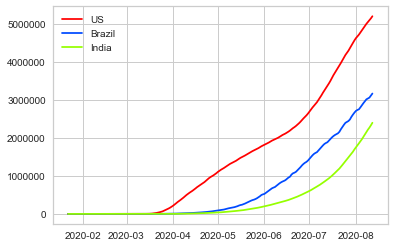

In [25]:
countries = ['US', 'Brazil', 'India']
plot_cases(countries)

### Visualizing Case Counts on a Map

In [26]:
fig = px.choropleth(case_stats_by_date, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "blues",
                    color = 'confirmed_cases',
                    title='COVID-19 Cases')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/confirmed_cases.svg')

### Distribution of Case Counts and Changes in Case Counts

In [27]:
daily_data = all_data_by_date_diffs[all_data_by_date_diffs['Date'] == datetime(2020, 7, 20)]

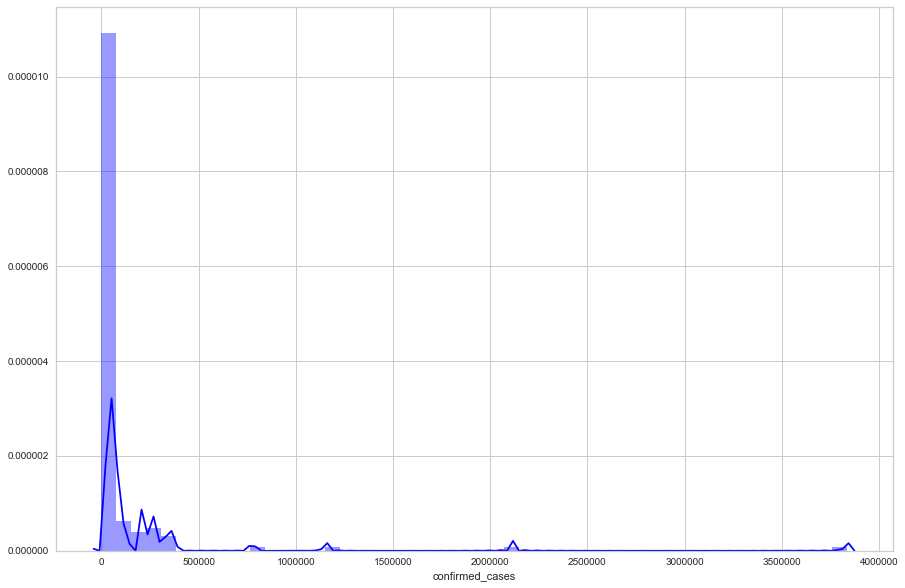

In [28]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.distplot(daily_data['confirmed_cases'], ax=ax, color='blue')

### Visualizing Deaths on a Map

In [29]:
fig = px.choropleth(deaths_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "reds",
                    color = 'deaths',
                    title='COVID-19 Deaths')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/deaths.svg')

### Visualizing Daily Deaths and Changes in Deaths

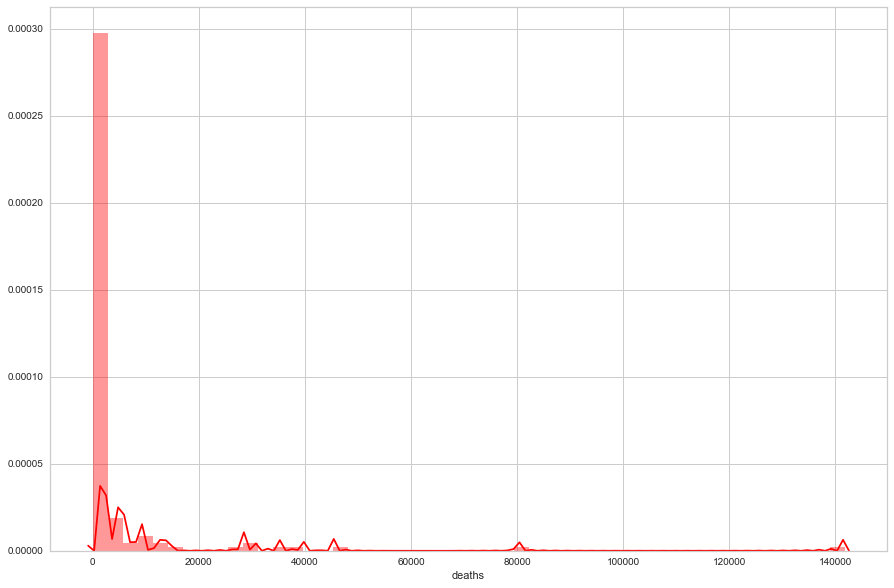

In [30]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.distplot(daily_data['deaths'], ax=ax, color='red')

### Visualizing Recovered Cases on a Map

In [31]:
fig = px.choropleth(recovered_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "greens",
                    color = 'recovered',
                    title='COVID-19 Recovered Cases')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/recovered.svg')

### Confirmed Cases, Deaths, and Recoveries

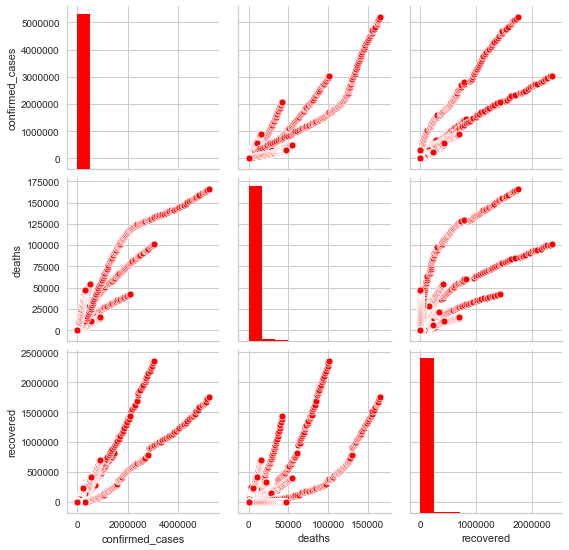

In [32]:
sns.pairplot(all_data_by_date[['confirmed_cases','deaths', 'recovered']])

### Visualizing Policy Changes Around the World

In [33]:
merged_policy_data['Date_string'] = merged_policy_data['Date'].map(lambda x: str(x))

In [34]:
fig = px.choropleth(merged_policy_data,
                    animation_frame = 'Date_string',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "greens",
                    color = 'Cancel public events (OxBSG)',
                    range_color=(0, 2),
                    title='Cancellation of Public Events')

fig.show()

### Looking at Case Differences

In [35]:
def plot_columns(data, country, columns):
    
    country_data = data[data['Country/Region'] == country]
    plt.figure(figsize=(15, 10))
    for column in columns:
        plt.plot(country_data['Date'], country_data[column], label=column)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend(loc='best')
    plt.title('Trends for {}'.format(country))
    plt.show()
    
def filter_by_country(data, country):
    
    return data[data['Country/Region'] == country]

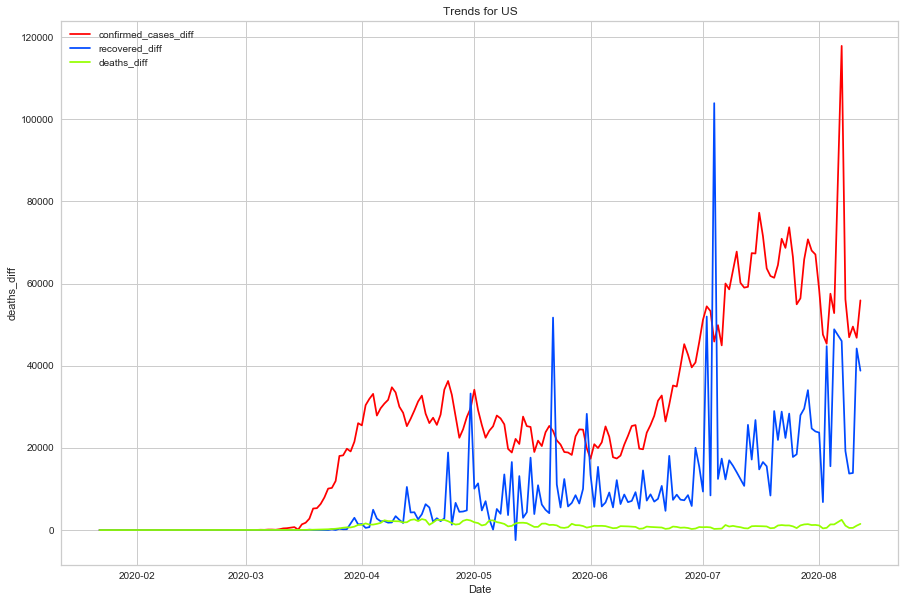

In [36]:
plot_columns(all_data_by_date_diffs, 
            'US', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

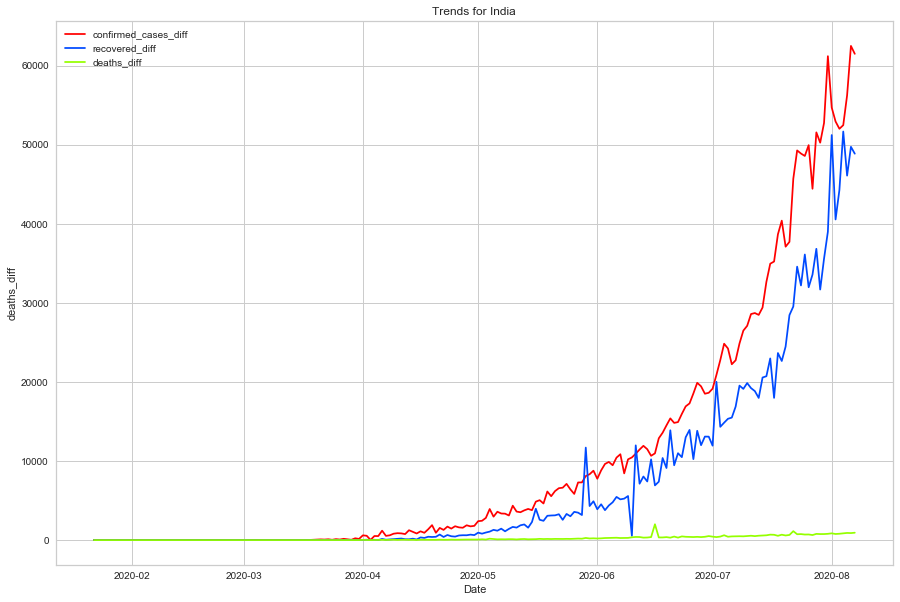

In [37]:
plot_columns(all_data_by_date_diffs, 
            'India', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

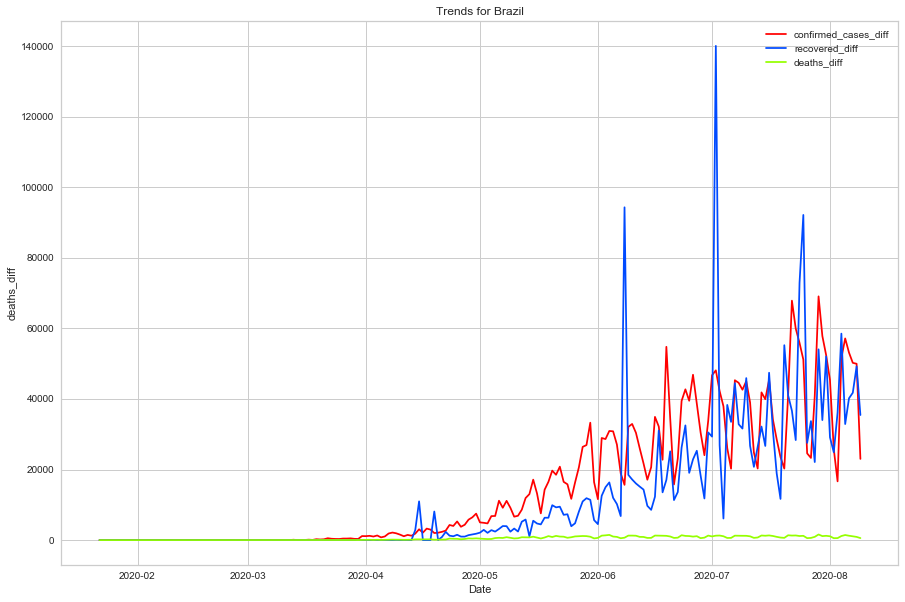

In [38]:
plot_columns(all_data_by_date_diffs, 
            'Brazil', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

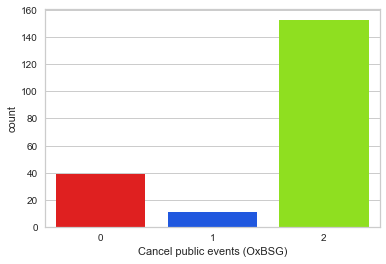

In [39]:
sns.countplot(filter_by_country(all_data_by_date_diffs, country='US')['Cancel public events (OxBSG)'])

In [40]:
def get_policy_counts(data):
    
    policy_counts_dict = defaultdict()
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data.columns)))
    
    data_one_hot = pd.get_dummies(data, columns=policy_cols)
    new_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data_one_hot.columns)))
    
    countries = data['Country/Region'].unique()
    
    for col in new_policy_cols + ['Country/Region']:
        policy_counts_dict[col] = []
        
        
    for country in countries:
        policy_counts_dict['Country/Region'].append(country)
        country_data = filter_by_country(data_one_hot, country=country)
        policy_counts = country_data[new_policy_cols].sum()
        for col in new_policy_cols:
            policy_counts_dict[col].append(policy_counts[col])
            
    
    return pd.DataFrame(policy_counts_dict)

In [41]:
policy_counts_data = get_policy_counts(all_data_by_date_diffs)
policy_counts_data

,Cancel public events (OxBSG)_0,Cancel public events (OxBSG)_1,Cancel public events (OxBSG)_2,Restrictions on gatherings (OxBSG)_0,Restrictions on gatherings (OxBSG)_1,Restrictions on gatherings (OxBSG)_2,Restrictions on gatherings (OxBSG)_3,Restrictions on gatherings (OxBSG)_4,Public information campaigns (OxBSG)_0,Public information campaigns (OxBSG)_1,...,International travel controls (OxBSG)_0,International travel controls (OxBSG)_1,International travel controls (OxBSG)_2,International travel controls (OxBSG)_3,International travel controls (OxBSG)_4,Testing policy (OxBSG)_0,Testing policy (OxBSG)_1,Testing policy (OxBSG)_2,Testing policy (OxBSG)_3,Country/Region
0,39,0,165,74,0,0,0,130,39,0,...,32,65,0,107,0,32,172,0,0,Afghanistan
1,47,0,156,47,0,40,0,116,23,25,...,34,15,55,29,70,46,122,35,0,Albania
2,48,0,156,68,0,0,94,42,43,40,...,50,2,0,3,149,60,144,0,0,Algeria
3,51,139,14,167,0,0,37,0,84,22,...,77,0,79,48,0,40,47,37,80,Andorra
4,65,0,137,62,0,3,62,75,62,54,...,15,0,24,19,144,35,35,132,0,Angola
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,17,41,137,64,0,6,104,21,7,0,...,3,5,2,90,95,5,11,62,117,Vietnam
163,43,0,161,43,0,17,79,65,31,12,...,43,0,16,0,145,44,160,0,0,West Bank and Gaza
164,86,0,118,204,0,0,0,0,59,145,...,56,0,0,0,148,204,0,0,0,Yemen
165,132,49,23,64,0,0,117,23,30,0,...,30,0,138,0,36,56,148,0,0,Zambia


## Analysis

## What measures are most effective at slowing the spread of COVID-19?

### Naive Approach - Looking at Correlations

In [42]:
policy_cols = list(filter(lambda x: 'OxBSG' in x, list(all_data_by_date_diffs.columns)))
target_cols = ['confirmed_cases', 'deaths', 'recovered']

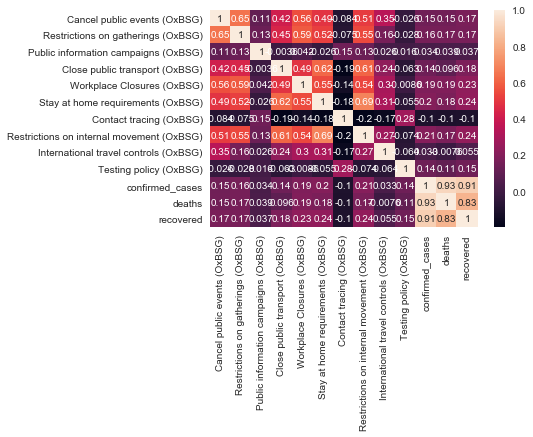

In [43]:
sns.heatmap(daily_data[policy_cols + target_cols].corr(), annot=True)

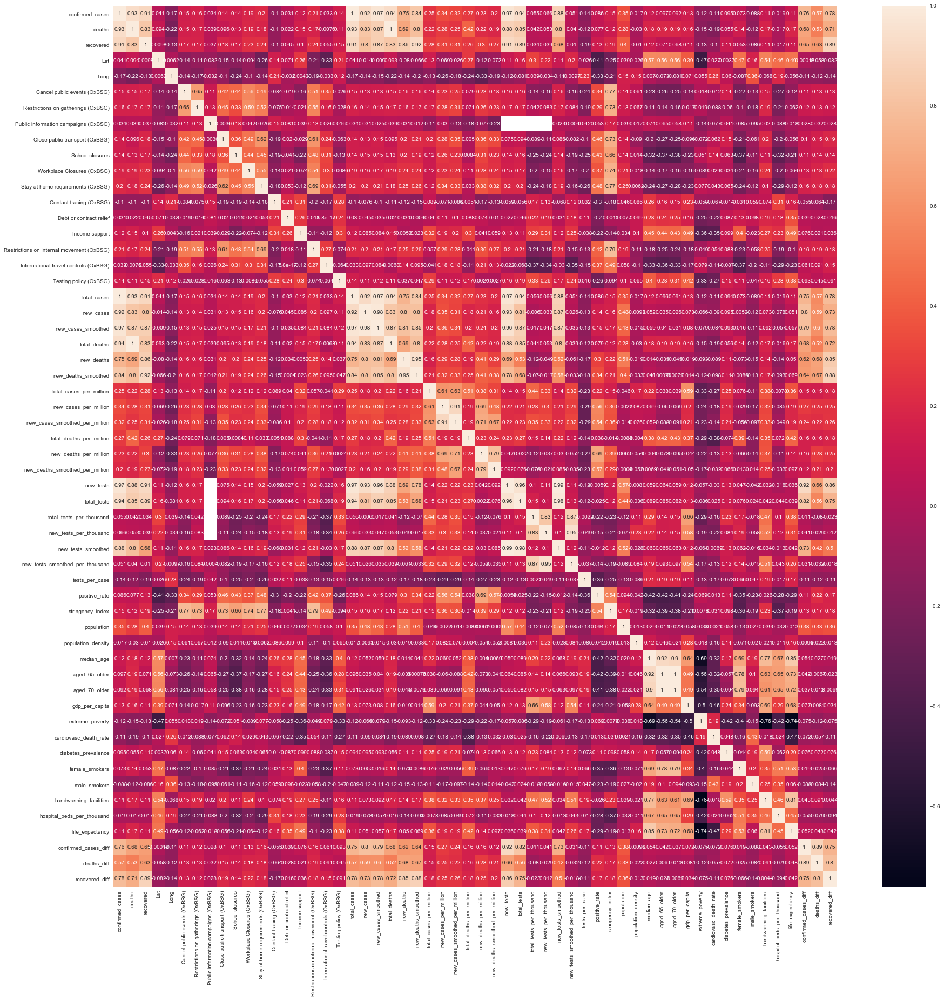

In [44]:
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(daily_data.drop(['Country/Region',
                 'continent',
                 'date',
                 'Date',
                 'location',
                 'iso_code',
                 'tests_units'],
                  axis=1).corr(), annot=True, ax=ax)

### Creating Country Profiles

In [45]:
def create_country_profiles(data, drop_cols):
    

    last_date = data['Date'].max()
    latest_data = data[data['Date'] == last_date]
    policy_counts_data = get_policy_counts(data)
    original_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(latest_data.columns)))
    latest_data.drop(policy_cols, axis=1, inplace=True)
    
    country_profiles = pd.merge(latest_data, policy_counts_data, 
         how='inner', 
         on=['Country/Region'])
    
    country_profiles.drop(drop_cols, axis=1, inplace=True)
    
    return country_profiles  

In [46]:
drop_cols = ['total_cases', 'new_cases', 'new_cases_smoothed',
             'new_deaths_smoothed', 'new_deaths_smoothed_per_million',
             'total_deaths', 'new_tests_smoothed_per_thousand',
             'new_tests_smoothed', 'date', 'iso_code', 'new_tests',
             'new_deaths', 'tests_per_case', 'new_cases_smoothed_per_million', 'new_deaths_per_million']

country_profiles = create_country_profiles(all_data_by_date_diffs, drop_cols)

In [47]:
country_profiles = pd.get_dummies(country_profiles, columns=['tests_units'])

### Training XGBoost Model to Gauge Feature Importance

In [48]:
from xgboost import XGBRegressor, plot_importance
xgb = XGBRegressor(n_estimators=50)

### Confirmed Cases as Target Variable

In [49]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['confirmed_cases']

In [50]:
xgb.fit(X, y)

[13:26:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=50,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

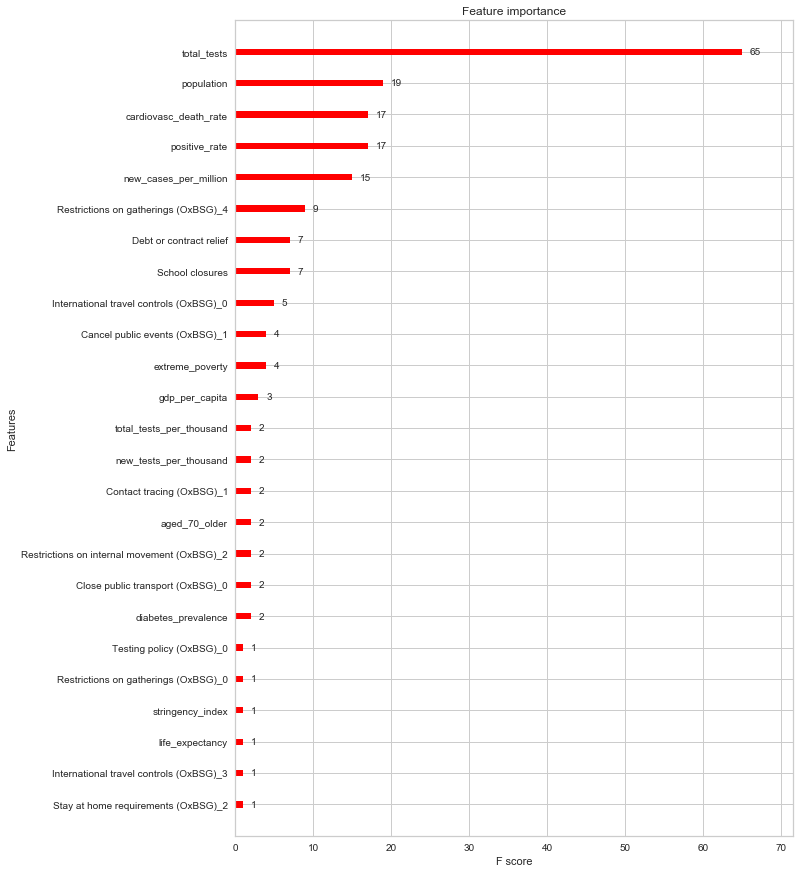

In [51]:
fig, ax = plt.subplots(figsize=(10, 15))
plot_importance(xgb, max_num_features=30, ax=ax)

In [52]:
def build_importance_plot(X, y):
    
    xgb = XGBRegressor(n_estimators=50)
    xgb.fit(X, y)
    
    fig, ax = plt.subplots(figsize=(10, 15))
    plot_importance(xgb, max_num_features=30, ax=ax)

### Deaths as Target Variable

[13:26:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


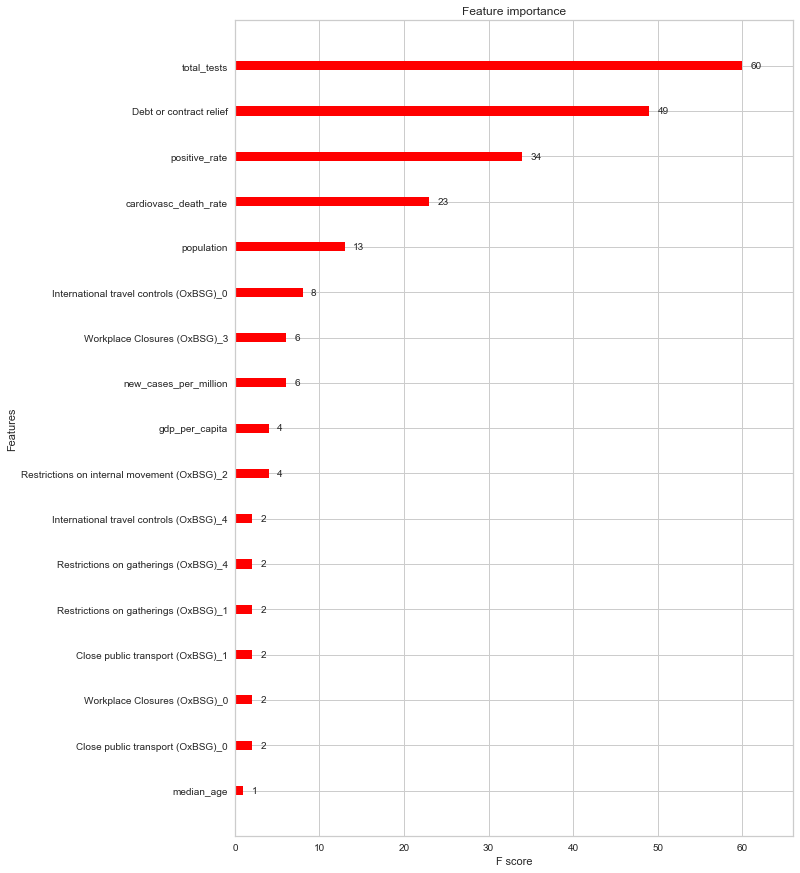

In [53]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['deaths']

build_importance_plot(X, y)

### Recovered Cases as Target Variable

[13:26:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


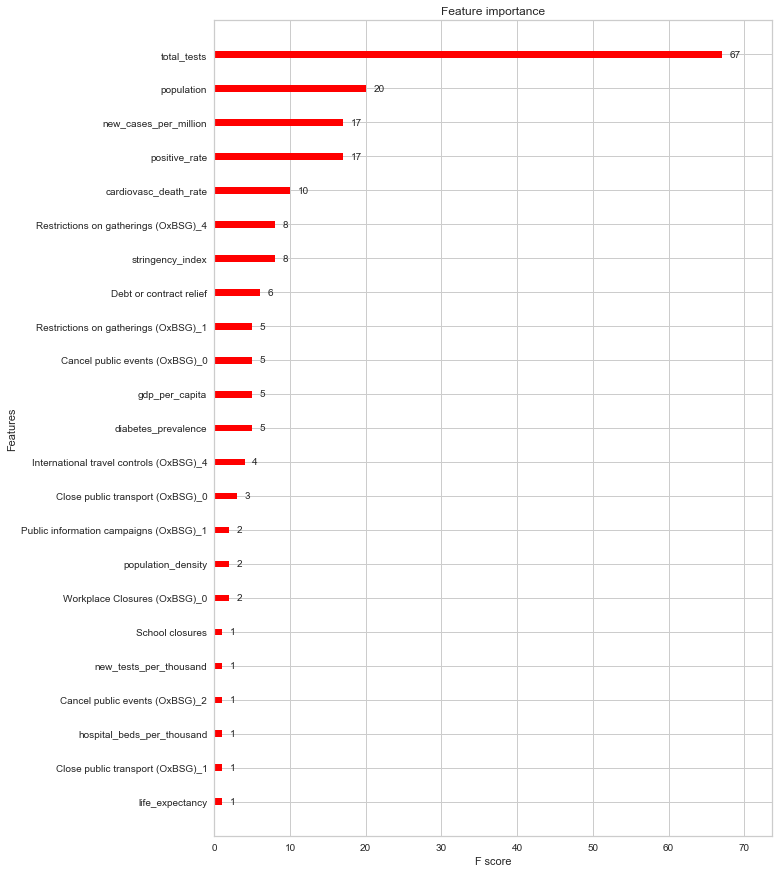

In [54]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['recovered']

build_importance_plot(X, y)

### Total Cases Per Million as Target

[13:26:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


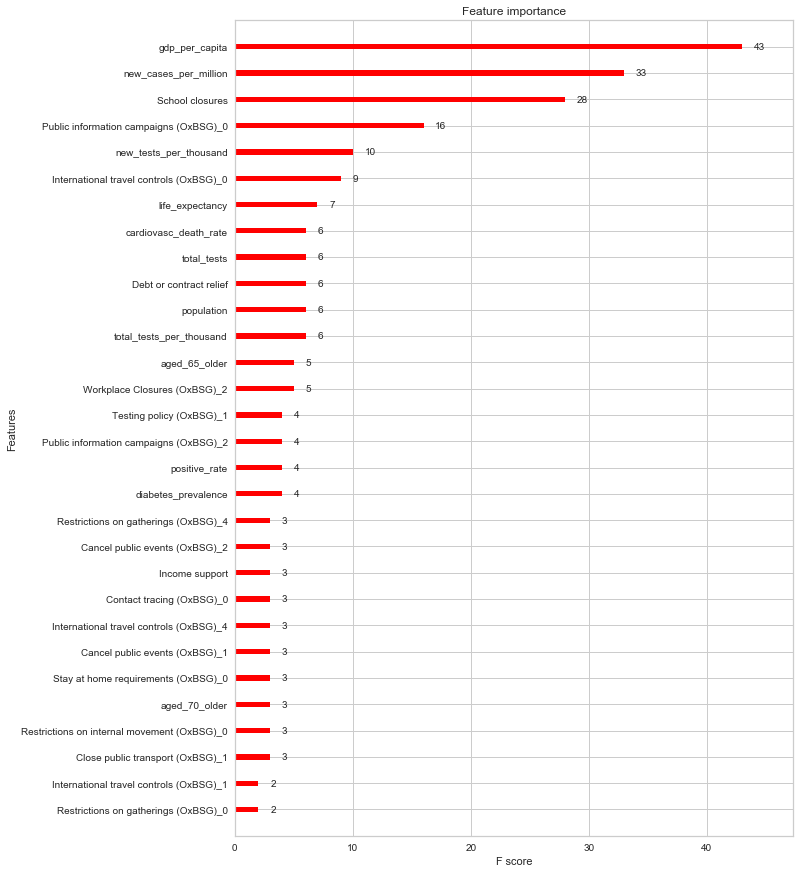

In [55]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million', 
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_cases_per_million']

build_importance_plot(X, y)

### Total Deaths Per Million as Target

[13:26:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


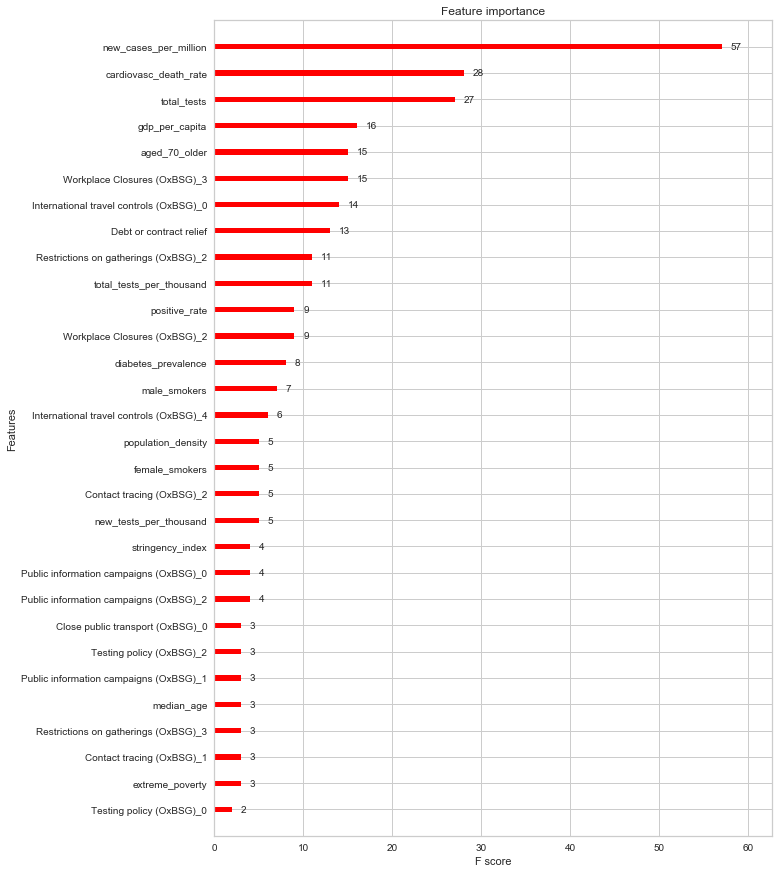

In [56]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_deaths_per_million']

build_importance_plot(X, y)

## Forecasting COVID-19 Cases and Deaths on a Daily Basis

In [57]:
def create_timeseries_dataset(data, target):
    
    n = len(data)
    X = data.iloc[0:n-1]
    y = data.iloc[1:n][target]
    
    return X, y

def create_timeseries_dataset_all_countries(data, target):
    
    countries = list(data['Country/Region'].unique())
    
    X_data = []
    y_data = []
    
    for country in countries:
        country_data = filter_by_country(data, country)
        X_i, y_i = create_timeseries_dataset(data, target)
        X_data.append(X_i)
        y_data.append(y_i)
    
    X = pd.concat(X_data, axis=0)
    y = np.concatenate(y_data)
    
   # X.rename({target: 'current_' + target}, inplace=True)
    
    return X, y

def train_test_split_by_date(X, y, start_date, cutoff_date, targets=['confirmed_cases', 'deaths', 'recovered']):
    
    targets = [target + '_next' for target in targets]
    data = X
    for index, target in enumerate(targets):
        data[target] = y[:, index]
    train = data[(data['Date'] >= start_date) & (data['Date'] <= cutoff_date)]
    test = data[data['Date'] > cutoff_date]
    
    X_train, y_train = train.drop(targets +  ['Date'], axis=1), train[targets]
    X_test, y_test = test.drop(targets + ['Date'], axis=1), test[targets]
    
    return X_train, X_test, y_train, y_test

## Forecasting Cases

### Preparing the Data

In [58]:
drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate',
                          'continent', 'location', 'iso_code', 'date', 'tests_units']

data_for_timeseries = all_data_by_date_diffs.drop(drop_cols, axis=1)


X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               target=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop('Country/Region', axis=1, inplace=True)
policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns))) + ['School closures', 
                                                                           'Debt or contract relief',
                                                                           'Income support']


In [59]:
from sklearn.model_selection import train_test_split, cross_validate, KFold
from sklearn.metrics import r2_score, mean_squared_error
train_data = defaultdict()

start_date = datetime(2020, 1, 1)
cutoff_date = datetime(2020, 7, 15)
X_train, X_test, y_train, y_test = train_test_split_by_date(X, y, start_date, cutoff_date)
train_data['X_train'], train_data['X_val'], train_data['y_train'], train_data['y_val'] = train_test_split(X_train,
                                                                                                          y_train,
                                                                                                          test_size=0.2)

In [60]:
from sklearn.metrics import r2_score, mean_absolute_error

def mean_absolute_percentage_error(y_pred, y_true):
    
    n = len(y_pred)
    percentage_errors = np.abs(y_pred - y_true) / np.abs(y_true)
    mape = np.average(percentage_errors, dtype=np.float64)
    return mape

def evaluate_model(model, X_test, y_test):
    
    pred = model.predict(X_test)
    print('R2 = {}'.format(r2_score(y_test, pred)))
    print('MAE = {}'.format(mean_absolute_error(y_test, pred)))
    print('Average Predicted Confirmed Cases = {}'.format(np.mean(pred[:, 0])))
    print('Average Actual Confirmed Cases = {}'.format(np.mean(y_test.values[:, 0])))
    print('Average Predicted Deaths = {}'.format(np.mean(pred[:, 1])))
    print('Average Actual Deaths = {}'.format(np.mean(y_test.values[:, 1])))
    print('Average Predicted Recovered = {}'.format(np.mean(pred[:, 0])))
    print('Average Actual Recovered  = {}'.format(np.mean(y_test.values[:, 0])))
    #print('MAPE w/o zeros = {} %'.format(100*mean_absolute_percentage_error(pred, y_test)))
    return pred

In [61]:
def plot_residuals(pred, y_test, index):
    residuals = pred[:, index] - y_test.values[:, index]
    residual_df = pd.DataFrame({'residuals': residuals, 'predicted_values': pred[:, index]})
    sns.jointplot(x='predicted_values', y='residuals', data=residual_df, height=10)

### Using a Neural Network

#### Writing a Custom Data Cleaning Transformer

In [62]:
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer

def clean_data(X):
    
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns))) + ['School closures', 
                                                                           'Debt or contract relief',
                                                                           'Income support']
    X_one_hot = pd.get_dummies(X, columns=policy_cols)
    imputer = SimpleImputer(strategy='median')
    X_imputed = imputer.fit_transform(X_one_hot)
    
    return X_imputed

data_cleaner = FunctionTransformer(clean_data)

In [63]:
from sklearn.preprocessing import OneHotEncoder    
from sklearn.base import BaseEstimator, TransformerMixin


class CustomOneHotEncoder(BaseEstimator, TransformerMixin):
    
    def __init__(self, encode_cols):
        
        self.encode_cols = encode_cols
        self.col_mapping_dict = defaultdict()
        self.one_hot_cols = defaultdict()
        

    def fit(self, X, y=None):
        
        for col in self.encode_cols:
            unique_values = list(X[col].unique())
            self.col_mapping_dict[col] = unique_values
            self.one_hot_cols[col] = []
            for value in unique_values:
                self.one_hot_cols[col] = self.one_hot_cols[col] + [col + '_' + str(value)]
        
        return self
        
    
    def _one_hot_encode(self, target, value):
        
        return int(target == value);
    
    def transform(self, X):
        
        X_copy = X
        for col in self.encode_cols:
            print('Working on ', col)
            targets = self.col_mapping_dict[col]
            for target in targets:
                one_hot_col = col + '_' + str(target)
                X_copy[one_hot_col] = X_copy[col].map(lambda x: self._one_hot_encode(target, x))
        
        return X_copy.drop(self.encode_cols, axis=1)
            
        

def make_categorical(data, cat_cols):
    
    for col in cat_cols:
        data[col] = data[col].astype('category')
    
    return data

In [64]:
from sklearn.neural_network import MLPRegressor
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import *

def build_model():
    
    model = Sequential()
    model.add(Dense(74, input_dim=74, activation='relu'))
    model.add(Dense(74, activation='relu'))
    model.add(Dense(74, activation='relu'))
    model.add(Dense(3, activation='relu'))
    
    model.compile(loss='mse', optimizer='adam', metrics=['mae'])
    
    return model

early_stopping = EarlyStopping(patience=1, monitor='mae', mode='min')
    
cases_neural_net_model = KerasRegressor(build_fn=build_model, epochs=5, 
                                        batch_size=32, verbose=1,
                                        callbacks=[early_stopping])

Using TensorFlow backend.


In [65]:
from sklearn.pipeline import Pipeline

master_model = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('neural_net', cases_neural_net_model)], verbose=True)

In [71]:
master_model.fit(X_train, y_train)  

Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
[Pipeline] ........... (step 1 of 4) Processing encoder, total= 4.4min
[Pipeline] ........... (step 2 of 4) Processing imputer, total=  56.0s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=  11.0s
Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Epoch 1/5
4905291/4905291 [==============================] - 198s 40us/step - loss: 1036098.4046 - mae: 120.5351
Epoch 2/5
4905291/4905291 [==============================] - 

Pipeline(steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                                                  'Restrictions on internal '
                                         

In [72]:
pred = evaluate_model(master_model, X_test, y_test)

Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
747492/747492 [==============================] - 14s 19us/step
R2 = 0.523167197626404
MAE = 637.7744227848939
Average Predicted Confirmed Cases = 1919.3558349609375
Average Actual Confirmed Cases = 1406.1391867739053
Average Predicted Deaths = 44.54502487182617
Average Actual Deaths = 33.42560321715818
Average Predicted Recovered = 1919.3558349609375
Average Actual Recovered  = 1406.1391867739053


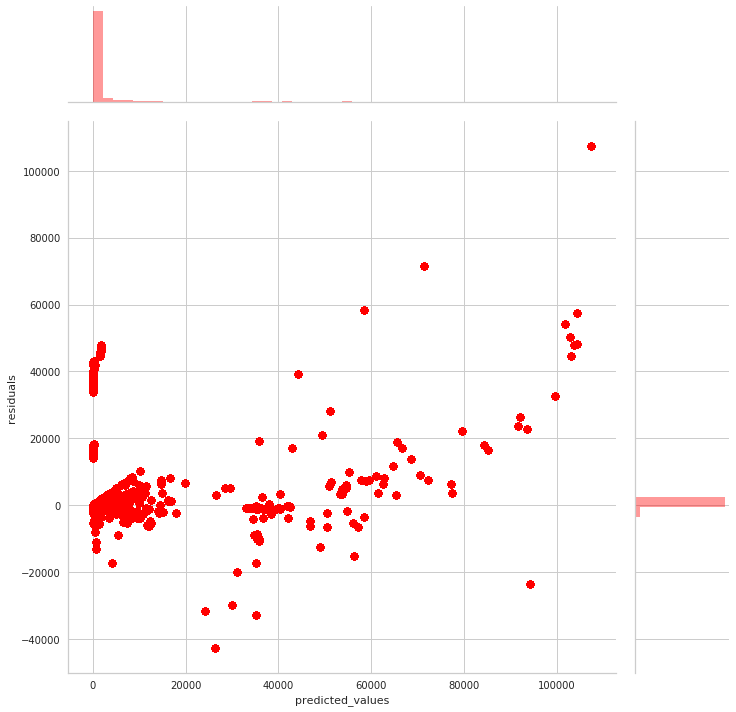

In [73]:
plot_residuals(pred, y_test, index=0)

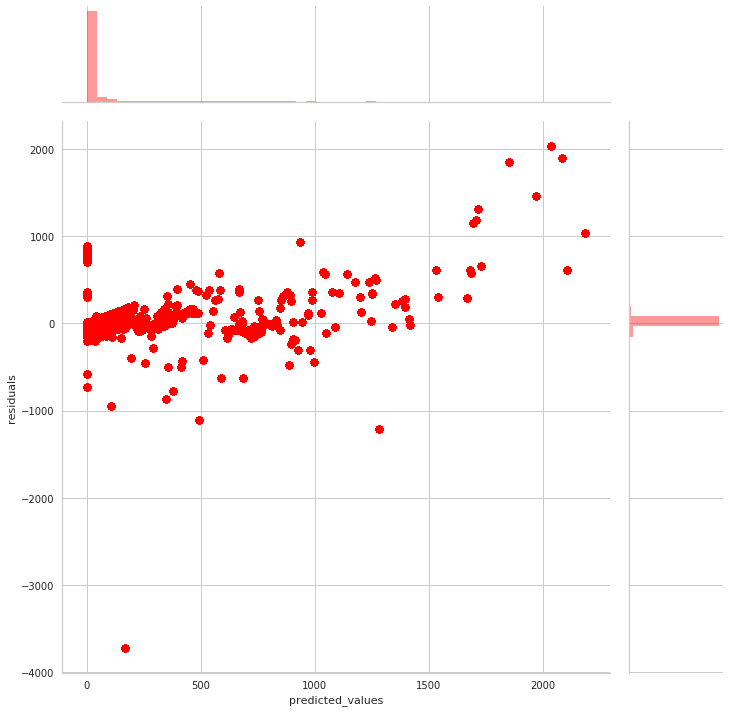

In [74]:
plot_residuals(pred, y_test, index=1)

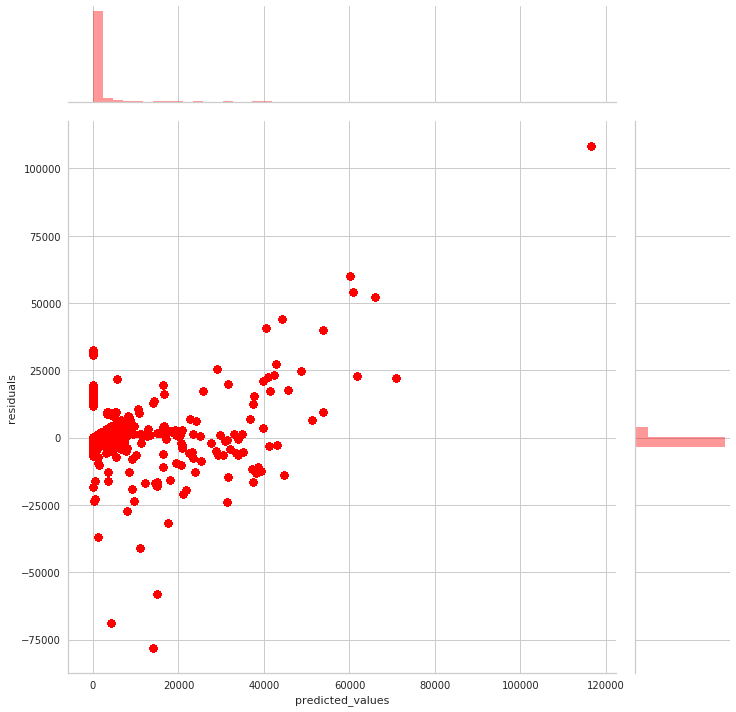

In [75]:
plot_residuals(pred, y_test, index=2)

In [76]:
dump(master_model, 'master_neural_net_latest.joblib')

['master_neural_net_latest.joblib']

## Generating and Visualizing Daily Forecasts for COVID-19 in the U.S.

### Loading Model and Defining Utility Functions

In [66]:
master_model = load('master_neural_net_latest.joblib')

In [138]:
from datetime import timedelta

drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate',
                          'continent', 'location', 'iso_code', 'date', 'tests_units', 'Country/Region', 'Date']

stringency_index_cols = ['Cancel public events (OxBSG)', 'Restrictions on gatherings (OxBSG)',
                         'Public information campaigns (OxBSG)', 'Workplace Closures (OxBSG)',
                         'Stay at home requirements (OxBSG)', 'Restrictions on internal movement (OxBSG)',
                         'International travel controls (OxBSG)', 'Testing policy (OxBSG)',
                         'School closures']

def set_policy_cols(data, policy_dict):
    
    if policy_dict is None:
        
        return data
    
    else:
        
        for col, value in policy_dict.items():
            data[col] = data[col].map(lambda x: value)
    
        return data

def create_max_value_dict(data, policy_cols):
    
    data_dict = defaultdict()
    
    for col in policy_cols:
        data_dict[col] = data[col].max()
    
    return data_dict

max_value_dict = create_max_value_dict(all_data_by_date_diffs, policy_cols)

def normalize(policy_col, value, max_value_dict):
    
    return 100.0 * (value / max_value_dict[policy_col])

def calculate_stringency_index(data, policy_cols):
    
    normalized_scores = []
    for col in policy_cols:
        normalized_scores.append(normalize(col, data[col].values[-1], max_value_dict))
    
    return np.mean(np.array(normalized_scores))

def get_latest_data(data, country):
    
    country_data = filter_by_country(data, country=country)
    latest_date = country_data['Date'].max()
    latest_data = country_data[country_data['Date'] == latest_date]
    
    return latest_data
            

def predict_future(data, country, n_days, drop_cols, policy_dict):
    
    country_data = filter_by_country(data, country=country)
    forecast_results = pd.DataFrame()
    
    for i in range(n_days):
        if i == 0:
            latest_date = country_data['Date'].max()
            latest_data = country_data[country_data['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)
        else:
            latest_date = forecast_results['Date'].max()
            print('Last date: ', latest_date)
            latest_data = forecast_results[forecast_results['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)  
            print('New date: ', new_date)
            print(latest_data['confirmed_cases'])
        
        latest_data = set_policy_cols(latest_data, policy_dict)
        pred = master_model.predict(latest_data.drop(drop_cols, axis=1))
        cases_diff = pred[:, 0]
        deaths_diff = pred[:, 1]
        recovered_diff = pred[:, 2]
        cases_pred = cases_diff + latest_data['confirmed_cases']
        deaths_pred = deaths_diff + latest_data['deaths']
        recovered_pred = recovered_diff + latest_data['recovered']
        stringency_index = calculate_stringency_index(latest_data, stringency_index_cols)
        
        #print(latest_data.info())
        forecast_data = set_policy_cols(latest_data, policy_dict)
        forecast_data['confirmed_cases'] = cases_pred
        forecast_data['deaths'] = deaths_pred
        forecast_data['recovered'] = recovered_pred
        forecast_data['confirmed_cases_diff'] = cases_diff
        forecast_data['deaths_diff'] = deaths_diff
        forecast_data['recovered_diff'] = recovered_diff
        forecast_data['stringency_index'] = stringency_index
        forecast_data['Date'] = [new_date]
        
        forecast_results = forecast_results.append(forecast_data)
    
    return forecast_results

def plot_forecast(forecast_results, country, columns):
    
    plt.figure(figsize=(15, 10))
    for columns in columns:
        plt.plot(forecast_results['Date'], forecast_results[column], label=column)
    plt.xlabel('Date')
    plt.ylabel('Statistics')
    plt.legend(loc='best')
    plt.title('Forecast for {}'.format(country))
    plt.show()

default_columns = ['confirmed_cases', 'deaths', 'recovered']

### Case 1: No Policy Changes

In [130]:
predictions_case_1 = predict_future(all_data_by_date_diffs, 
                                    'US', n_days=30, 
                                    drop_cols=drop_cols, policy_dict=None)

Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-08-13 00:00:00
New date:  2020-08-14 00:00:00
31418    5.304590e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (O

1/1 [==============================] - 0s 2ms/step
Last date:  2020-08-24 00:00:00
New date:  2020-08-25 00:00:00
31418    6.225339e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 3ms/step
Last date:  2020-08-25 00:00:00
New date:  2020-08-26 00:00:00
31418    6.312180e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information ca

Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 2ms/step
Last date:  2020-09-05 00:00:00
New date:  2020-09-06 00:00:00
31418    7.467687e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-09-06 00:00:00
New date:  2020-09-07 00:00:00
31418

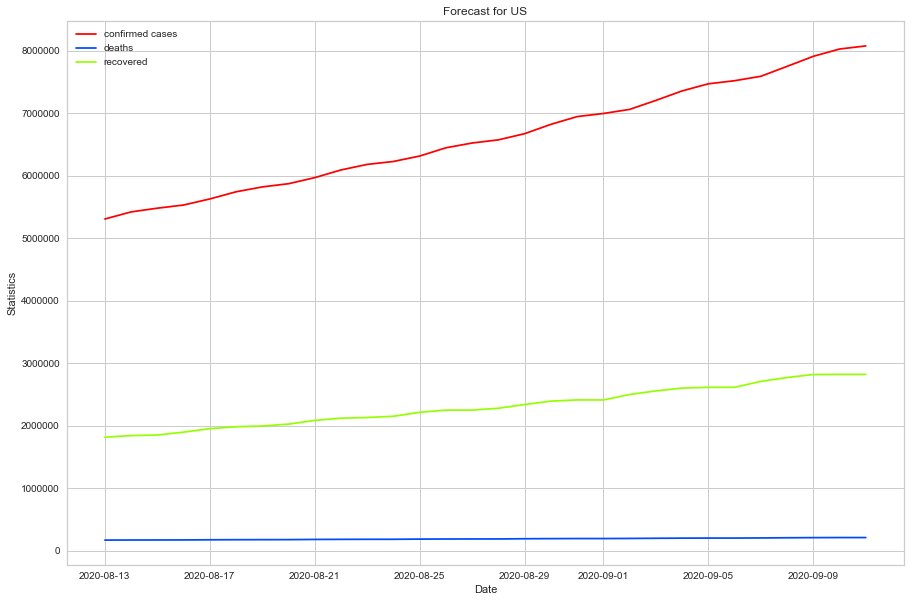

In [131]:
plot_forecast(predictions_case_1, country='US', columns=default_columns)

### Case 2: Adding Comprehensive Contact Tracing and Closing the Border

In [132]:
policy_dict = {'Contact tracing (OxBSG)': 2, 'International travel controls (OxBSG)': 3}
predictions_case_2 = predict_future(all_data_by_date_diffs, 'US', n_days=30, 
                                    drop_cols=drop_cols, policy_dict=policy_dict)

Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-08-13 00:00:00
New date:  2020-08-14 00:00:00
31418    5.309352e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (O

Working on  Income support
1/1 [==============================] - 0s 2ms/step
Last date:  2020-08-24 00:00:00
New date:  2020-08-25 00:00:00
31418    6.295041e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-08-25 00:00:00
New date:  2020-08-26 00:00:00
31418    6.338662e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Workin

1/1 [==============================] - 0s 2ms/step
Last date:  2020-09-05 00:00:00
New date:  2020-09-06 00:00:00
31418    7.413241e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-09-06 00:00:00
New date:  2020-09-07 00:00:00
31418    7.566318e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information ca

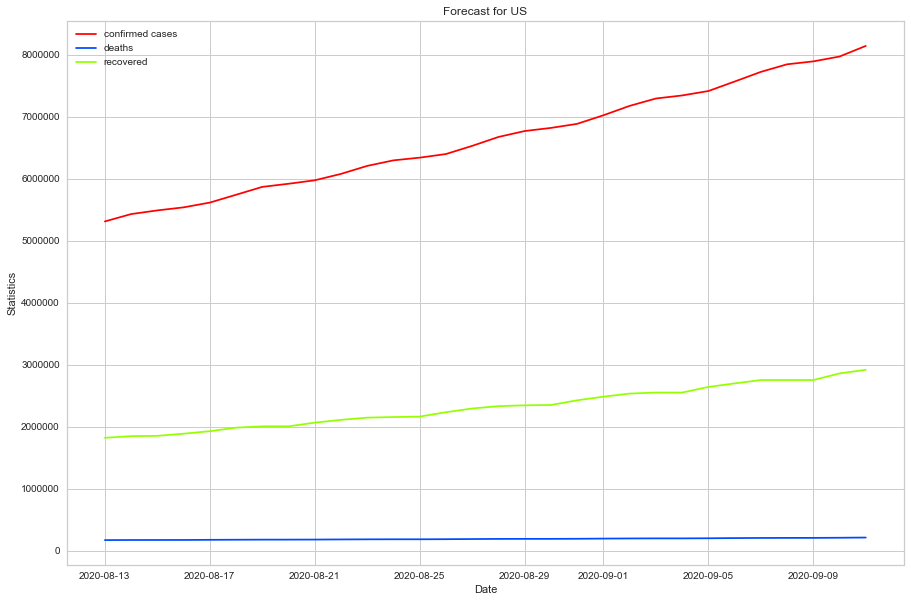

In [133]:
plot_forecast(predictions_case_2, country='US', columns=default_columns)

### Case 3: Maximum Restrictions and Financial Support/Relief

In [136]:
policy_dict = {'Contact tracing (OxBSG)': 2, 
               'International travel controls (OxBSG)': 3,
               'Close public transport (OxBSG)': 2,
               'Debt or contract relief': 2,
               'Income support': 2, 
               'Stay at home requirements (OxBSG)': 3}

predictions_case_3 = predict_future(all_data_by_date_diffs, 'US', n_days=30, 
                                    drop_cols=drop_cols, policy_dict=policy_dict)

Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-08-13 00:00:00
New date:  2020-08-14 00:00:00
31418    5.326076e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (O

Last date:  2020-08-24 00:00:00
New date:  2020-08-25 00:00:00
31418    6.415822e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 2ms/step
Last date:  2020-08-25 00:00:00
New date:  2020-08-26 00:00:00
31418    6.558223e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport 

Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-09-05 00:00:00
New date:  2020-09-06 00:00:00
31418    7.794432e+06
Name: confirmed_cases, dtype: float64
Working on  Cancel public events (OxBSG)
Working on  Restrictions on gatherings (OxBSG)
Working on  Public information campaigns (OxBSG)
Working on  Close public transport (OxBSG)
Working on  Workplace Closures (OxBSG)
Working on  Stay at home requirements (OxBSG)
Working on  Contact tracing (OxBSG)
Working on  Restrictions on internal movement (OxBSG)
Working on  International travel controls (OxBSG)
Working on  Testing policy (OxBSG)
Working on  School closures
Working on  Debt or contract relief
Working on  Income support
1/1 [==============================] - 0s 1ms/step
Last date:  2020-09-06 00:00:00
New date:  2020-09-07 00:00:00
31418    7.841770e+06
Name: confirmed_cases, dtype: flo

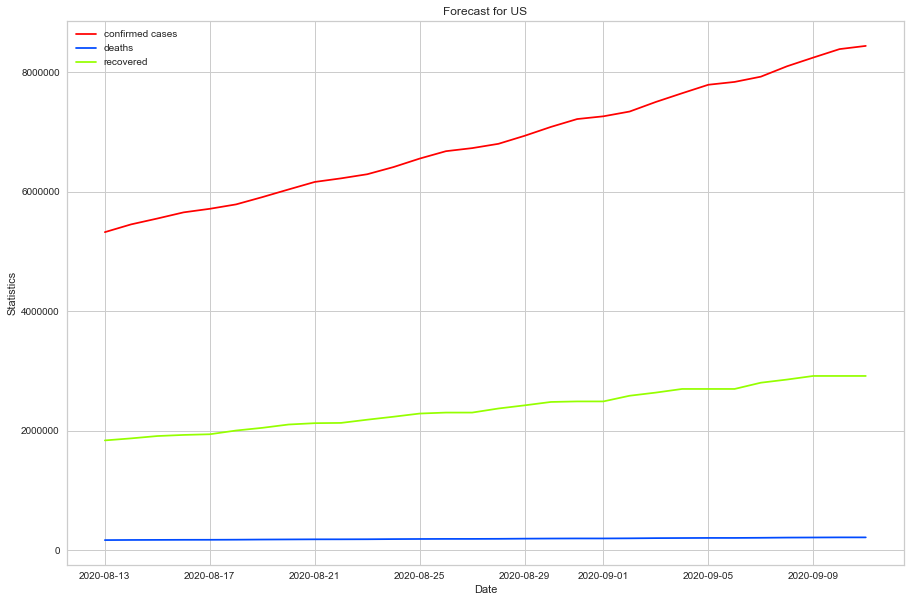

In [137]:
plot_forecast(predictions_case_3, country='US', columns=default_columns)